In [ ]:
pip install pytorch_model_summary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision import datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
from torch import distributions
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import torch.nn.functional as F
from pytorch_model_summary import summary

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


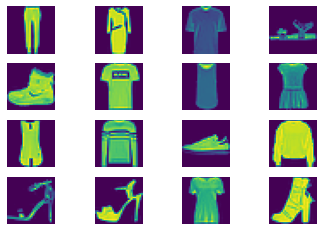

In [ ]:
# Fashion MNIST Dataset

# Transformations as per tensorflow 
transform = transforms.Compose([
        transforms.Lambda(lambda x: np.round(np.array(x)/27).astype(int)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: torch.flatten(x))
    ])

xtrain = datasets.FashionMNIST(
        root="data",
        train=True,
        download=True,
        transform=transform
    )

xtest = datasets.FashionMNIST(
    root="data",
    train=False,
    download=True,
    transform=transform
)

def draw_grid(imlist, m, n):
  fig, grid = plt.subplots(m,n) 
  for i in range(m):
    for j in range(n):
      grid[i,j].axis('off')
      grid[i,j].imshow(np.reshape(imlist[(i-1)*m+j], (28,28)))
  # print(np.reshape(imlist[(i-1)*m+j], (28,28)))    
    
draw_grid((xtrain.data).detach().numpy(), 4,4)

In [ ]:
#Loss Calculations 


# Calculates loss based on the states by one-hot encoding taking log prob
def log_categorical(x, p, num_classes=10, reduction=None, dim=None):
    EPS = 1.e-5
    log_prob = F.one_hot(x.long(), num_classes=num_classes) * torch.log(torch.clamp(p, EPS, 1. - EPS))
    if reduction == 'avg':
        return torch.mean(log_prob, dim)
    elif reduction == 'sum':
        return torch.sum(log_prob, dim)
    else:
        return log_prob


# finds the logarithm of normal distribution
def log_standard_normal(x, reduction=None, dim=None):
    D = x.shape[1]
    log_p = -0.5 * D * torch.log(2. * torch.from_numpy(np.asarray(np.pi))) - 0.5 * x**2.
    if reduction == 'avg':
        return torch.mean(log_p, dim)
    elif reduction == 'sum':
        return torch.sum(log_p, dim)
    else:
        return log_p


def log_normal_diag(x, mu, log_var, reduction=None, dim=None):
    D = x.shape[1]

    log_prob = -0.5 * D * torch.log(2. * torch.from_numpy(np.asarray(np.pi))) - 0.5 * log_var - 0.5 * torch.exp(-log_var) * (x - mu)**2.

    if reduction == 'avg':
        return torch.mean(log_prob, dim)
    elif reduction == 'sum':
        return torch.sum(log_prob, dim)
    else:
        return log_prob

In [ ]:
class VaeEncoder(nn.Module):
    def __init__(self, encoder_net):
        super(VaeEncoder, self).__init__()

        self.encoder = encoder_net

    def encode(self, x):

        h_e = self.encoder(x)
        # print(h_e)
        mu_e, log_var_e = torch.chunk(h_e, 2, dim=1)
        # print(x.shape,mu_e.shape,log_var_e.shape)
        return mu_e, log_var_e

    def e_sample(self, x=None, mu_e=None, log_var_e=None):

        # mu_e, log_var_e = self.encode(x)
        if (mu_e is None) and (log_var_e is None):
            mu_e, log_var_e = self.encode(x)
        else:
            if (mu_e is None) or (log_var_e is None):
                raise ValueError('mu and log-var can`t be None!')

        # reparameterization to calculate q(z|x)
        std_dev = torch.exp(0.5*log_var_e)
        e = torch.randn_like(std_dev)
        z = mu_e + std_dev * e

        return z

    def log_prob_encoder(self, x=None, mu_e=None, log_var_e=None, z=None):
        if x is not None:
            mu_e, log_var_e = self.encode(x)
            z = self.sample(mu_e=mu_e, log_var_e=log_var_e)
        else:
            if (mu_e is None) or (log_var_e is None) or (z is None):
                raise ValueError('mu, log-var and z can`t be None!')

        return log_normal_diag(z, mu_e, log_var_e)

    def forward(self, x, find='log_prob'):
        if find == 'log_prob':
            return self.log_prob_encoder(x)
        else:
            return self.e_sample(x)

In [ ]:
class VaeDecoder(nn.Module):
    def __init__(self, decoder_net, states=None):
        super(VaeDecoder, self).__init__()

        self.decoder = decoder_net
        # self.distribution = distribution
        self.states=states

    def decode(self, z):
        h_d = self.decoder(z)
        b,d = h_d.shape[0],h_d.shape[1]//self.states
        h_d = h_d.view(b, d, self.states)
        mu_d = torch.softmax(h_d, 2)
        return mu_d

    def d_sample(self, z):
        mu_d = self.decode(z)
        b,m = mu_d.shape[0],mu_d.shape[1]
        mu_d = mu_d.view(mu_d.shape[0], -1, self.states)
        # print(mu_d.shape)
        p = mu_d.view(-1, self.states)
        # print(p.shape)
        x_new = torch.multinomial(p, num_samples=1).view(b, m)

        return x_new

    def log_prob_decoder(self, x, z):
        outs = self.decode(z)
        mu_d = outs
        log_p = log_categorical(x, mu_d, num_classes=self.states, reduction='sum', dim=-1).sum(-1)

        return log_p

    def forward(self, z, x=None, find='log_prob'):
        if find == 'log_prob':
            return self.log_prob_decoder(x, z)
        else:
            return self.d_sample(x)

In [ ]:
class betaVAE(nn.Module):
    def __init__(self, beta, encoder_net, decoder_net, states=10, L=16):
        super(betaVAE, self).__init__()

        self.encoder = VaeEncoder(encoder_net=encoder_net)
        self.decoder = VaeDecoder(decoder_net=decoder_net, states=states)
        self.L = L
        self.beta = beta
        self.states = states

    def forward(self, x, reduction='avg'):
        # encoder
        mu_e, log_var_e = self.encoder.encode(x)
        z = self.encoder.e_sample(mu_e=mu_e, log_var_e=log_var_e)

        # ELBO method rl + kl
        # print(x.shape,mu_e.shape,log_var_e.shape)
        RE = self.decoder.log_prob_decoder(x, z)

        # the divergence between q(z) and p(z|x)
        KL = (self.beta)*(log_standard_normal(z) - self.encoder.log_prob_encoder(mu_e=mu_e, log_var_e=log_var_e, z=z)).sum(-1)

        if reduction == 'sum':
            return -(RE + KL).sum(),-RE.sum(),-KL.sum()
        else:
            return -(RE + KL).mean(),-RE.mean(),-KL.mean()

    def sample(self, batch_size=64):
        # prior
        z = torch.randn((batch_size, self.L))
        return self.decoder.d_sample(z)

In [ ]:
def generate_sample(model_best):

    # Generating samples ...
    # model_best = torch.load(name + '.model')
    model_best.eval()

    x_dim,y_dim = 3,3

    x = model_best.sample(x_dim * y_dim)
    x = x.detach().numpy()

    # Plotting the samples in 3*3 grid 
    fig, ax = plt.subplots(x_dim, y_dim)
    for i, ax in enumerate(ax.flatten()):
        plot_image = np.reshape(x[i], (28, 28))
        ax.imshow(plot_image)
        ax.axis('off')
    plt.figure(figsize=(15, 15))
    plt.show()

def testing(test_loader, name=None, model_best=None, epoch=None):

    # Evaluating test data
    if model_best is None:
        # load best performing model
        model_best = torch.load(name +'.model')

    model_best.eval()
    loss,re_loss,kl_loss = 0.,0.,0.
    N_imgs = 0.
    for indx_batch, (test_batch,_) in enumerate(test_loader):
        loss_test,re_loss_test,kl_loss_test = model_best.forward(test_batch.type(torch.FloatTensor), reduction='sum')
        loss = loss + loss_test.item()
        re_loss = re_loss + re_loss_test.item()
        kl_loss = kl_loss + kl_loss_test.item()
        N_imgs = N_imgs + test_batch.shape[0]
    loss,re_loss,kl_loss = loss/N_imgs,re_loss/N_imgs,kl_loss/N_imgs

    if epoch is None:
        print(f'FINAL LOSS: nll={loss}, RL loss={re_loss}, KL loss={kl_loss}')
    else:
        print(f'Epoch: {epoch}, nll loss={loss}, RL loss={re_loss}, KL loss={kl_loss}')

    return loss,re_loss,kl_loss

In [ ]:
def training(name, num_epochs, model, optimizer, training_loader, test_loader):
    nll_val,rl_val,kl_val = [],[],[]
    best_nll = 1000.
    patience = 0

    # Main loop
    for e in range(num_epochs):
        # TRAINING
        model.train() 
        for indx_batch, (batch,_) in enumerate(training_loader):
            loss,_,_ = model.forward(batch.type(torch.FloatTensor))

            optimizer.zero_grad()
            loss.backward(retain_graph=True)
            optimizer.step()
        # Validation
        loss_val,re_loss,kl_loss = testing(test_loader, model_best=model, epoch=e)
        nll_val.append(loss_val)  # save for plotting
        rl_val.append(re_loss)  # save for plotting
        kl_val.append(kl_loss)  # save for plotting

        # Plotting samples ...    
        generate_sample(model)

    # Saving model    
    print('saved!')
    torch.save(model, name + '.model')

    nll_val = np.asarray(nll_val)
    rl_val = np.asarray(rl_val)
    kl_val = np.asarray(kl_val)

    return nll_val,rl_val,kl_val

In [ ]:
train_loader = torch.utils.data.DataLoader(xtrain, batch_size=100, shuffle=True)
test_loader = torch.utils.data.DataLoader(xtest, batch_size=100, shuffle=False)

result_dir = '/content/drive/MyDrive/vaemodel/results/'
if not(os.path.exists(result_dir)):
    os.mkdir(result_dir)
name = 'vae_beta'

In [438]:
def plot_loss(nll_val1,nll_val2,nll_val3,nll_val4):
    plt.plot(np.arange(len(nll_val1)), nll_val1, linewidth='3',label="nll beta =0.2")
    plt.plot(np.arange(len(nll_val2)), nll_val2, linewidth='3',label="nll beta 0.5")
    plt.plot(np.arange(len(nll_val3)), nll_val3, linewidth='3',label="nll beta 0.8")
    plt.plot(np.arange(len(nll_val4)), nll_val4, linewidth='3',label="nll beta 1")
    plt.xlabel('epochs')
    plt.ylabel('losses')
    plt.legend(loc="upper right")
    plt.show()
    # plt.savefig(name + '_nll_val_curve.pdf', bbox_inches='tight')
    plt.close()
def plot_loss1(nll_val1,nll_val2,nll_val3,nll_val4):
    plt.plot(np.arange(len(nll_val1)), nll_val1, linewidth='3',label="rl beta =0.2")
    plt.plot(np.arange(len(nll_val2)), nll_val2, linewidth='3',label="rl beta 0.5")
    plt.plot(np.arange(len(nll_val3)), nll_val3, linewidth='3',label="rl beta 0.8")
    plt.plot(np.arange(len(nll_val4)), nll_val4, linewidth='3',label="rl beta 1")
    plt.xlabel('epochs')
    plt.ylabel('losses')
    plt.legend(loc="upper right")
    plt.show()
    # plt.savefig(name + '_nll_val_curve.pdf', bbox_inches='tight')
    plt.close()
def plot_loss2(nll_val1,nll_val2,nll_val3,nll_val4):
    plt.plot(np.arange(len(nll_val1)), nll_val1, linewidth='3',label="kl beta =0.2")
    plt.plot(np.arange(len(nll_val2)), nll_val2, linewidth='3',label="kl beta 0.5")
    plt.plot(np.arange(len(nll_val3)), nll_val3, linewidth='3',label="kl beta 0.8")
    plt.plot(np.arange(len(nll_val4)), nll_val4, linewidth='3',label="kl beta 1")
    plt.xlabel('epochs')
    plt.ylabel('losses')
    plt.legend(loc="upper right")
    plt.show()
    # plt.savefig(name + '_nll_val_curve.pdf', bbox_inches='tight')
    plt.close()        

In [ ]:
Dims = 784   # input dimension
L = 16  # number of latents
H = 256  # the number of neurons in scale (s) and translation (t) nets
num_epochs = 11
lr = 1e-3 # learning rate

states = 10
encoder = nn.Sequential(nn.Linear(Dims, H), nn.LeakyReLU(),
                        nn.Unflatten(1, (1, 16, 16)),
                        nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
                        nn.MaxPool2d(2, 2),
                        nn.ReLU(),
                        nn.Flatten(),
                        nn.Linear(512, 128), nn.LeakyReLU(),
                        nn.Linear(128, 2 * L)
                   )
decoder = nn.Sequential(nn.Linear(L, 128), nn.LeakyReLU(),
                        nn.Linear(128, 512), nn.LeakyReLU(),
                        nn.Unflatten(1, (8, 8, 8)),
                        nn.ConvTranspose2d(8, 8, kernel_size=3),
                        nn.Flatten(),
                        nn.Linear(800, states * Dims)
                       )
# Print the summary
print("ENCODER:\n", summary(encoder, torch.zeros(1, Dims), show_input=False, show_hierarchical=False))
print("\nDECODER:\n", summary(decoder, torch.zeros(1, L), show_input=False, show_hierarchical=False))

ENCODER:
 -----------------------------------------------------------------------
      Layer (type)        Output Shape         Param #     Tr. Param #
          Linear-1            [1, 256]         200,960         200,960
       LeakyReLU-2            [1, 256]               0               0
       Unflatten-3      [1, 1, 16, 16]               0               0
          Conv2d-4      [1, 8, 16, 16]              80              80
       MaxPool2d-5        [1, 8, 8, 8]               0               0
            ReLU-6        [1, 8, 8, 8]               0               0
         Flatten-7            [1, 512]               0               0
          Linear-8            [1, 128]          65,664          65,664
       LeakyReLU-9            [1, 128]               0               0
         Linear-10             [1, 32]           4,128           4,128
Total params: 270,832
Trainable params: 270,832
Non-trainable params: 0
-----------------------------------------------------------------

# latent dimension = 16

Epoch: 0, nll loss=780.28442265625, RL loss=770.98770546875, KL loss=9.296720037841796


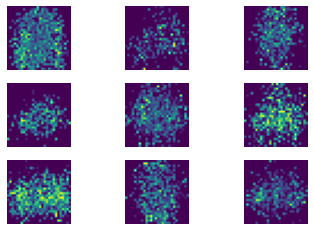

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=729.01158359375, RL loss=720.0108890625, KL loss=9.000698278808594


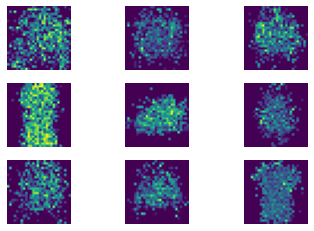

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=703.0419625, RL loss=693.709223828125, KL loss=9.332737127685547


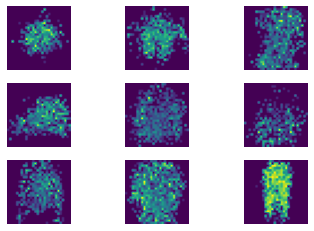

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=682.777903515625, RL loss=673.4332984375, KL loss=9.344608203125


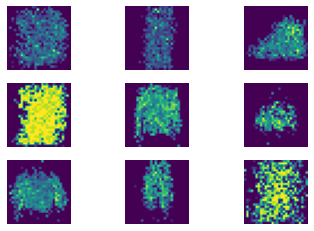

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=664.824466796875, RL loss=655.386812890625, KL loss=9.437657336425781


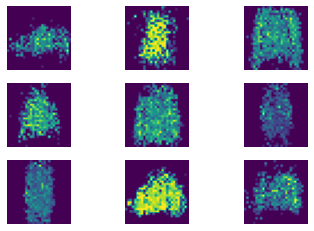

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=652.55552109375, RL loss=643.23241953125, KL loss=9.323102679443359


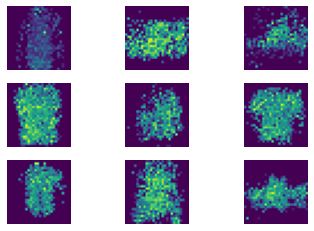

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=644.087312890625, RL loss=634.260326953125, KL loss=9.826983953857422


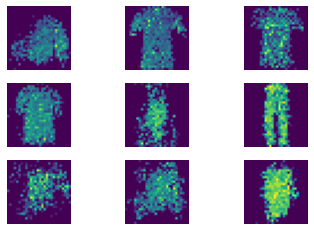

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=646.65631875, RL loss=636.628573828125, KL loss=10.027745001220703


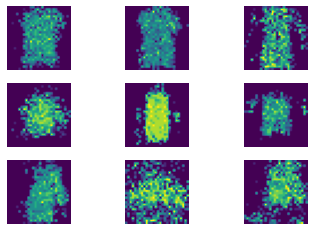

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=630.838539453125, RL loss=621.022059765625, KL loss=9.816482818603516


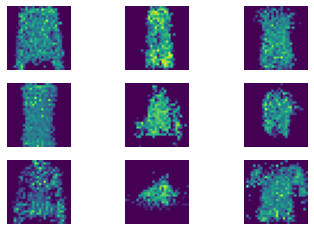

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=630.6204015625, RL loss=621.000712109375, KL loss=9.619681134033202


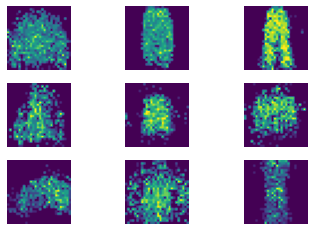

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=627.3639578125, RL loss=617.65656953125, KL loss=9.707385809326173


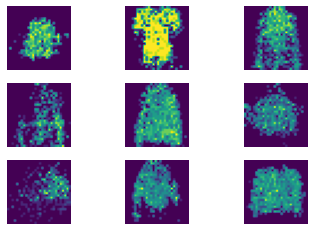

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 0.2
train_loader = torch.utils.data.DataLoader(xtrain, batch_size=100, shuffle=True)
test_loader = torch.utils.data.DataLoader(xtest, batch_size=100, shuffle=False)

model1 = betaVAE(beta=0.2,encoder_net=encoder, decoder_net=decoder, states=states, L=L)
optimizer = torch.optim.Adamax([p for p in model1.parameters() if p.requires_grad == True], lr=0.001)

nll_val1,rl_val1,kl_val1 = training(name=result_dir + name+'0.2'+'_16', num_epochs=num_epochs, model=model1, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=636.595444921875, RL loss=616.5722515625, KL loss=20.02319227294922


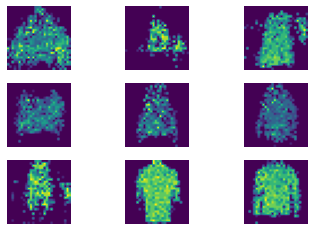

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=630.6488625, RL loss=610.91361875, KL loss=19.73524871826172


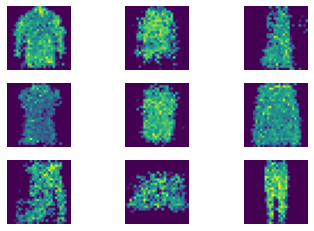

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=626.87919453125, RL loss=606.5055671875, KL loss=20.37362966308594


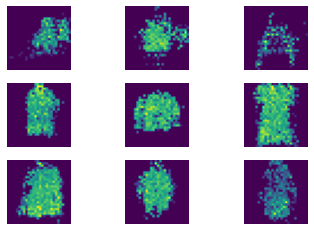

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=621.590305859375, RL loss=600.984500390625, KL loss=20.605803747558593


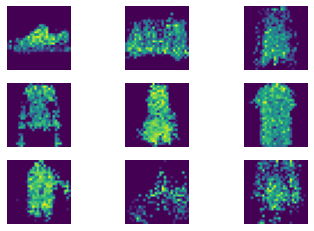

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=624.090302734375, RL loss=603.984637109375, KL loss=20.105659460449218


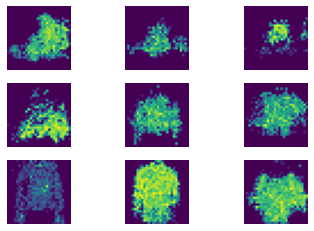

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=617.08728203125, RL loss=596.895683984375, KL loss=20.19159736328125


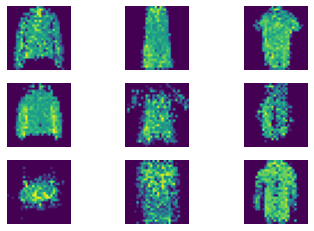

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=619.578373828125, RL loss=599.008847265625, KL loss=20.569523046875


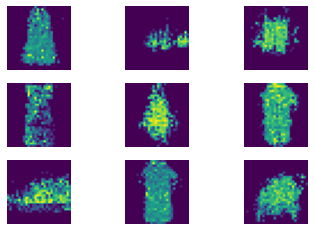

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=612.10601171875, RL loss=591.54282265625, KL loss=20.563189807128907


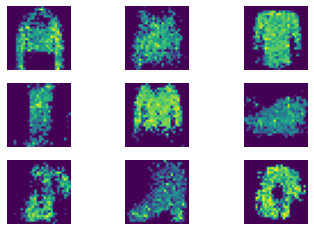

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=610.107754296875, RL loss=589.087019140625, KL loss=21.020738208007813


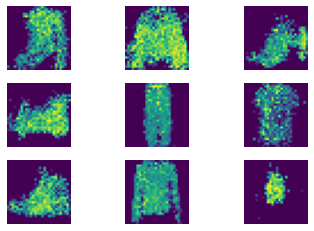

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=607.39443359375, RL loss=586.5962765625, KL loss=20.7981572265625


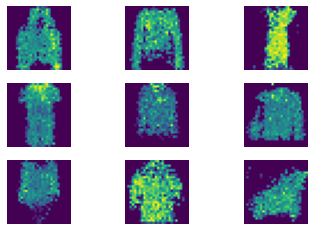

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=604.495314453125, RL loss=583.612312890625, KL loss=20.883004370117188


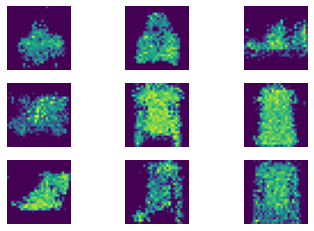

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 0.5
train_loader = torch.utils.data.DataLoader(xtrain, batch_size=100, shuffle=True)
test_loader = torch.utils.data.DataLoader(xtest, batch_size=100, shuffle=False)
model2 = betaVAE(beta=0.5,encoder_net=encoder, decoder_net=decoder, states=states, L=L)
optimizer = torch.optim.Adamax([p for p in model2.parameters() if p.requires_grad == True], lr=0.001)

nll_val2,rl_val2,kl_val2 = training(name=result_dir + name+'0.5'+'_16',  num_epochs=num_epochs, model=model2, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=614.84913125, RL loss=584.38050234375, KL loss=30.468630517578124


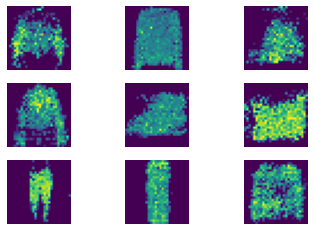

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=615.5196703125, RL loss=585.435126171875, KL loss=30.08453837890625


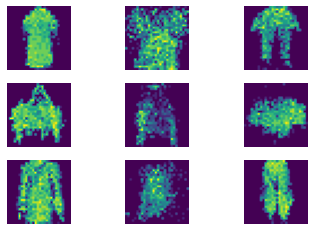

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=612.93405859375, RL loss=582.981374609375, KL loss=29.952686938476564


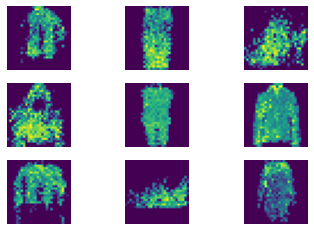

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=611.750561328125, RL loss=581.472532421875, KL loss=30.27803186035156


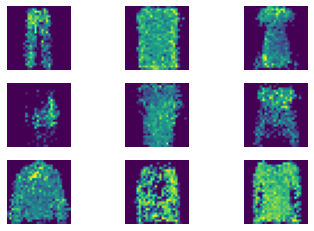

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=615.60478125, RL loss=585.6274421875, KL loss=29.977340234375


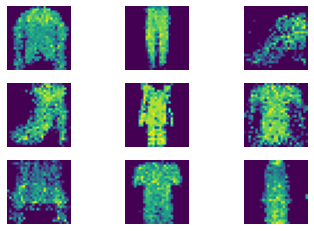

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=607.620675, RL loss=577.579217578125, KL loss=30.041457861328126


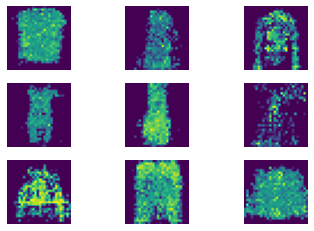

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=608.95937578125, RL loss=578.381159375, KL loss=30.578218603515626


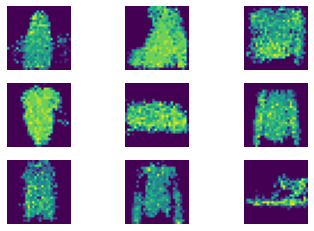

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=604.72163671875, RL loss=574.7285421875, KL loss=29.993097485351562


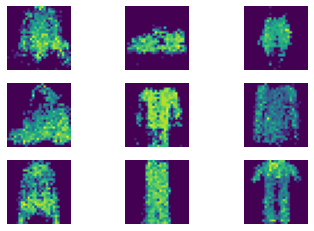

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=604.62165078125, RL loss=574.43647734375, KL loss=30.185173559570313


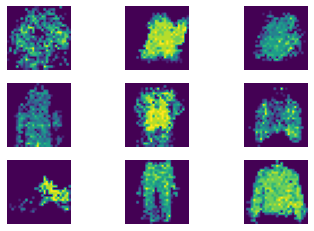

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=605.403422265625, RL loss=576.164142578125, KL loss=29.239280029296875


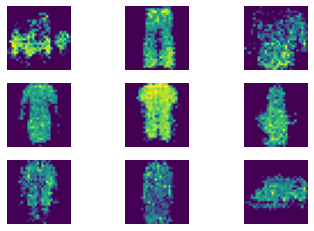

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=602.4837515625, RL loss=571.94521796875, KL loss=30.538534643554687


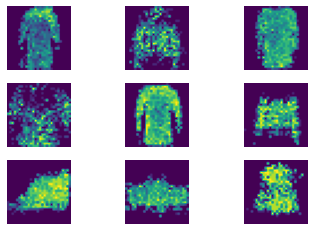

<Figure size 1080x1080 with 0 Axes>

Epoch: 11, nll loss=602.041348828125, RL loss=571.701978125, KL loss=30.339374780273438


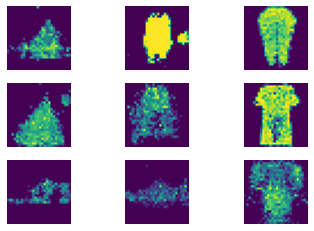

<Figure size 1080x1080 with 0 Axes>

Epoch: 12, nll loss=600.63111640625, RL loss=570.87908671875, KL loss=29.752036450195313


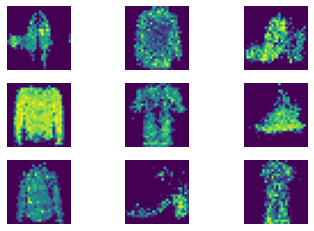

<Figure size 1080x1080 with 0 Axes>

Epoch: 13, nll loss=607.48125234375, RL loss=576.71514921875, KL loss=30.766103686523437


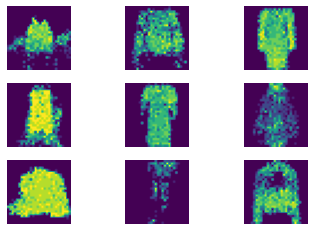

<Figure size 1080x1080 with 0 Axes>

Epoch: 14, nll loss=599.194290625, RL loss=568.366218359375, KL loss=30.828076098632813


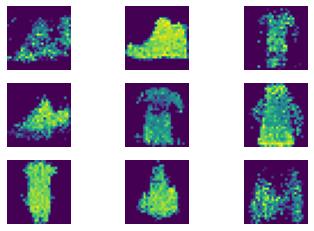

<Figure size 1080x1080 with 0 Axes>

Epoch: 15, nll loss=600.530657421875, RL loss=570.274188671875, KL loss=30.256465673828124


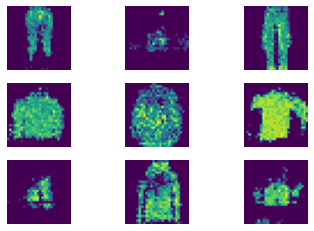

<Figure size 1080x1080 with 0 Axes>

Epoch: 16, nll loss=601.175077734375, RL loss=570.071687109375, KL loss=31.10338916015625


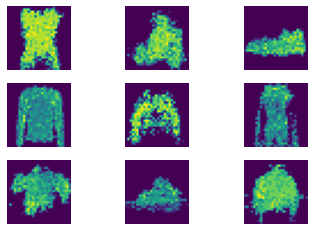

<Figure size 1080x1080 with 0 Axes>

Epoch: 17, nll loss=598.415069921875, RL loss=567.735875390625, KL loss=30.679197705078124


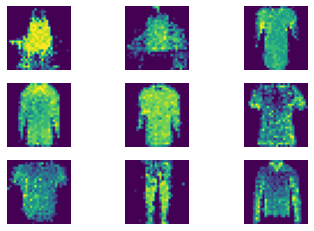

<Figure size 1080x1080 with 0 Axes>

Epoch: 18, nll loss=596.51790625, RL loss=566.105331640625, KL loss=30.412575366210937


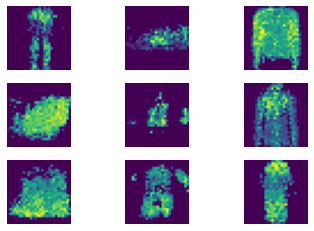

<Figure size 1080x1080 with 0 Axes>

Epoch: 19, nll loss=599.899208984375, RL loss=569.359576171875, KL loss=30.539637670898436


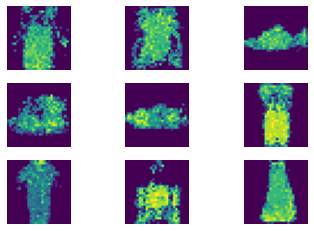

<Figure size 1080x1080 with 0 Axes>

Epoch: 20, nll loss=598.755446875, RL loss=568.214916796875, KL loss=30.54052998046875


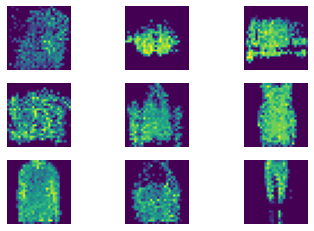

<Figure size 1080x1080 with 0 Axes>

Epoch: 21, nll loss=594.4472484375, RL loss=563.7886890625, KL loss=30.658556030273438


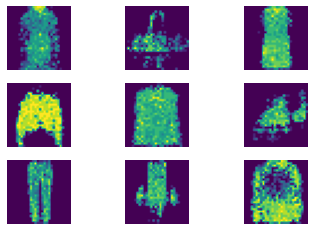

<Figure size 1080x1080 with 0 Axes>

Epoch: 22, nll loss=596.317639453125, RL loss=566.161820703125, KL loss=30.155814526367188


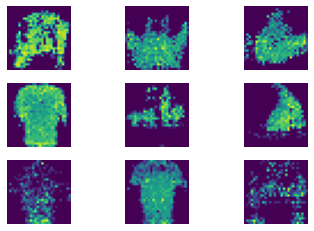

<Figure size 1080x1080 with 0 Axes>

Epoch: 23, nll loss=594.702302734375, RL loss=564.295569140625, KL loss=30.40673713378906


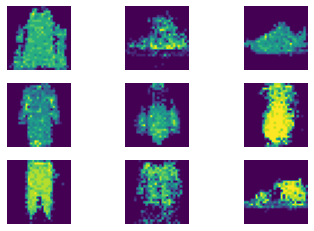

<Figure size 1080x1080 with 0 Axes>

Epoch: 24, nll loss=594.334202734375, RL loss=563.294372265625, KL loss=31.039831103515624


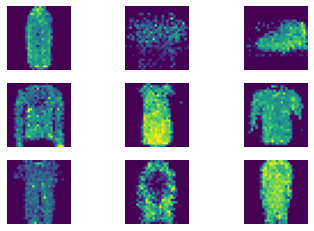

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 0.8
train_loader = torch.utils.data.DataLoader(xtrain, batch_size=100, shuffle=True)
test_loader = torch.utils.data.DataLoader(xtest, batch_size=100, shuffle=False)
model3 = betaVAE(beta=0.8,encoder_net=encoder, decoder_net=decoder, states=states, L=L)
optimizer = torch.optim.Adamax([p for p in model3.parameters() if p.requires_grad == True], lr=0.001)

nll_val3,rl_val3,kl_val3 = training(name=result_dir + name+'0.8'+'_16',  num_epochs=25, model=model3, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=600.768634375, RL loss=565.04420546875, KL loss=35.72442456054687


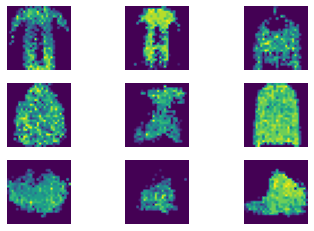

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=599.53786875, RL loss=563.485640625, KL loss=36.05222346191406


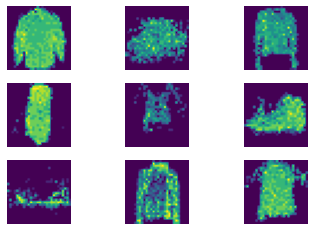

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=598.922721875, RL loss=563.32162890625, KL loss=35.60109245605469


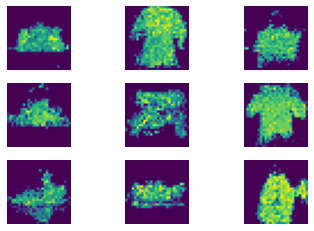

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=599.51273359375, RL loss=562.84481640625, KL loss=36.667910986328124


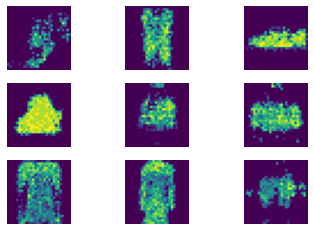

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=599.39453828125, RL loss=563.080085546875, KL loss=36.31445673828125


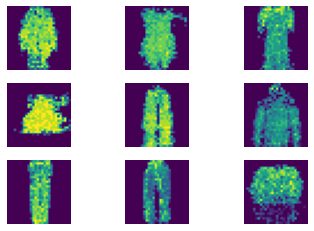

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=602.369251953125, RL loss=565.883755078125, KL loss=36.485493505859374


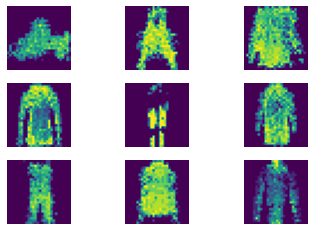

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=598.2932765625, RL loss=562.117121484375, KL loss=36.176156469726564


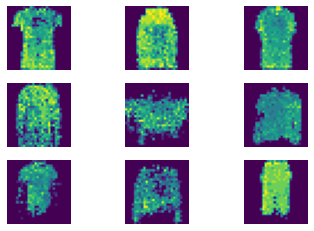

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=598.183146875, RL loss=561.749937890625, KL loss=36.433207885742185


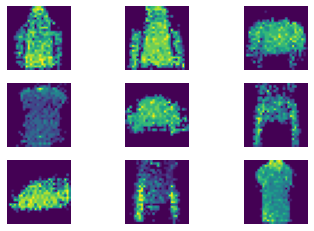

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=598.43749609375, RL loss=561.8558921875, KL loss=36.58159584960938


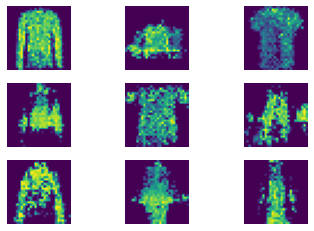

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=597.49217265625, RL loss=561.319514453125, KL loss=36.17266213378906


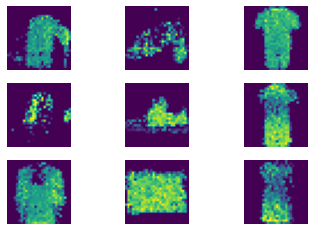

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=598.595794921875, RL loss=561.7020765625, KL loss=36.893723217773434


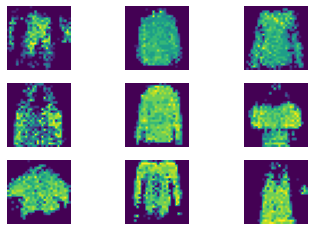

<Figure size 1080x1080 with 0 Axes>

Epoch: 11, nll loss=597.3279828125, RL loss=561.59007109375, KL loss=35.73792116699219


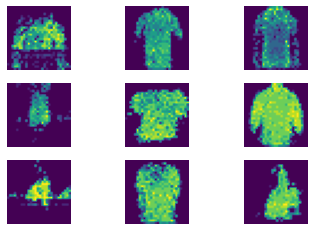

<Figure size 1080x1080 with 0 Axes>

Epoch: 12, nll loss=596.588135546875, RL loss=560.579240234375, KL loss=36.008893676757815


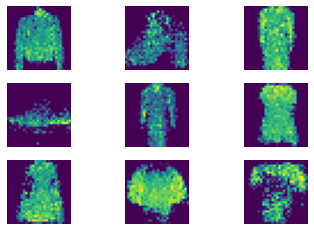

<Figure size 1080x1080 with 0 Axes>

Epoch: 13, nll loss=596.77250546875, RL loss=560.801589453125, KL loss=35.97091953125


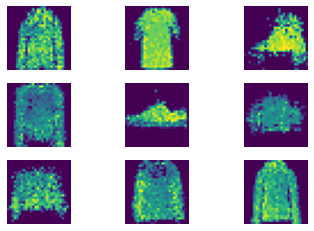

<Figure size 1080x1080 with 0 Axes>

Epoch: 14, nll loss=595.218507421875, RL loss=559.438437109375, KL loss=35.78007690429688


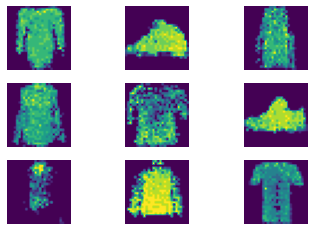

<Figure size 1080x1080 with 0 Axes>

Epoch: 15, nll loss=596.124433203125, RL loss=559.8756265625, KL loss=36.248804736328125


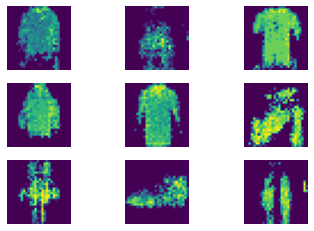

<Figure size 1080x1080 with 0 Axes>

Epoch: 16, nll loss=596.367230078125, RL loss=560.109269921875, KL loss=36.25795832519531


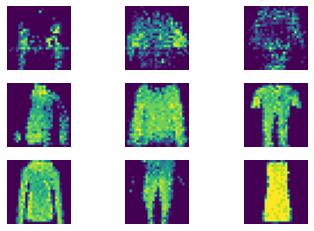

<Figure size 1080x1080 with 0 Axes>

Epoch: 17, nll loss=595.34811484375, RL loss=558.78774453125, KL loss=36.560371606445315


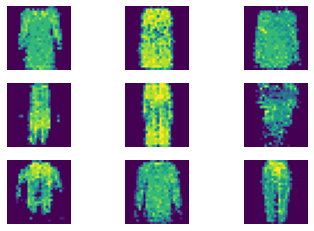

<Figure size 1080x1080 with 0 Axes>

Epoch: 18, nll loss=595.5607875, RL loss=559.083458984375, KL loss=36.47732272949219


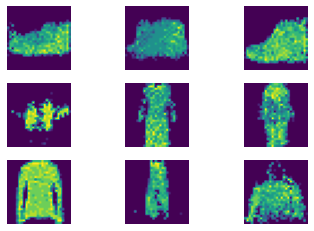

<Figure size 1080x1080 with 0 Axes>

Epoch: 19, nll loss=594.90191484375, RL loss=558.62482734375, KL loss=36.277085400390625


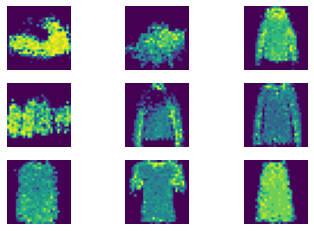

<Figure size 1080x1080 with 0 Axes>

Epoch: 20, nll loss=593.78169375, RL loss=557.3189203125, KL loss=36.46277126464844


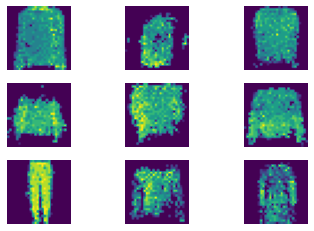

<Figure size 1080x1080 with 0 Axes>

Epoch: 21, nll loss=598.623785546875, RL loss=561.636502734375, KL loss=36.987280786132814


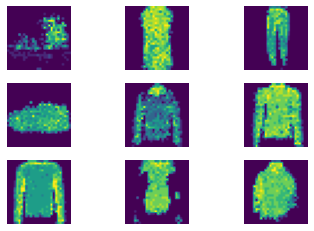

<Figure size 1080x1080 with 0 Axes>

Epoch: 22, nll loss=593.761284765625, RL loss=557.1104390625, KL loss=36.650847973632814


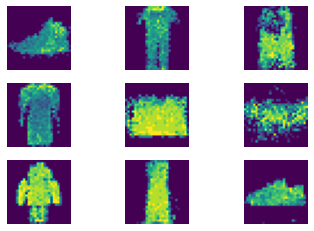

<Figure size 1080x1080 with 0 Axes>

Epoch: 23, nll loss=592.5499234375, RL loss=556.01337421875, KL loss=36.53655107421875


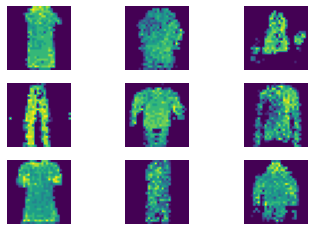

<Figure size 1080x1080 with 0 Axes>

Epoch: 24, nll loss=595.361170703125, RL loss=559.040365234375, KL loss=36.320810571289066


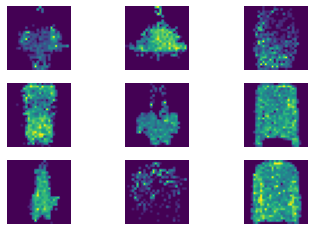

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 1

model4 = betaVAE(beta=1,encoder_net=encoder, decoder_net=decoder, states=states, L=L)
optimizer = torch.optim.Adamax([p for p in model4.parameters() if p.requires_grad == True], lr=0.001)

nll_val4,rl_val4,kl_val4 = training(name=result_dir + name+'1'+'_16', num_epochs=10, model=model4, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

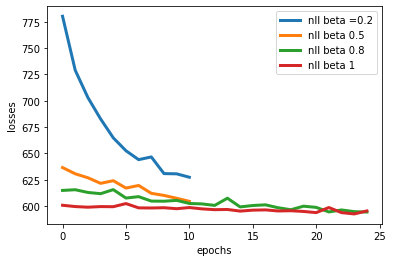

In [436]:
plot_loss(nll_val1,nll_val2,nll_val3,nll_val4)

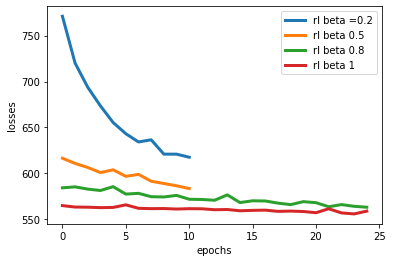

In [439]:
plot_loss1(rl_val1,rl_val2,rl_val3,rl_val4)

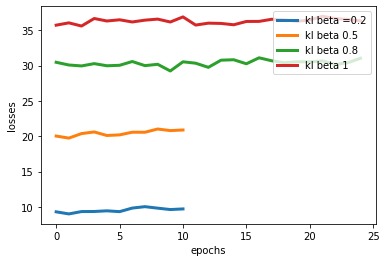

In [440]:
plot_loss2(kl_val1,kl_val2,kl_val3,kl_val4)

# latent dimension = 50

Epoch: 0, nll loss=772.28137265625, RL loss=757.9199328125, KL loss=14.361438977050781


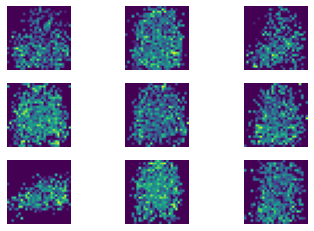

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=725.8236484375, RL loss=710.829616796875, KL loss=14.994028015136719


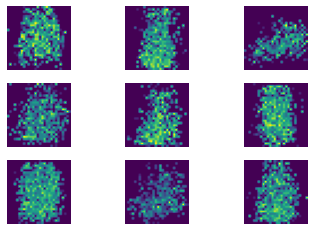

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=699.83207109375, RL loss=684.973448046875, KL loss=14.858613745117188


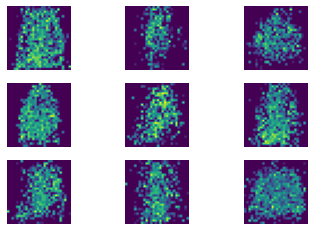

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=690.788955859375, RL loss=675.750269140625, KL loss=15.03868623046875


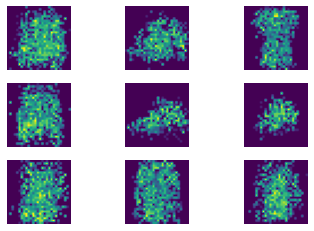

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=668.205350390625, RL loss=652.496022265625, KL loss=15.709320861816407


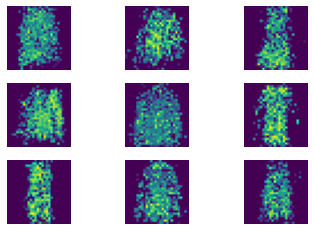

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=656.6194125, RL loss=640.498688671875, KL loss=16.120728881835937


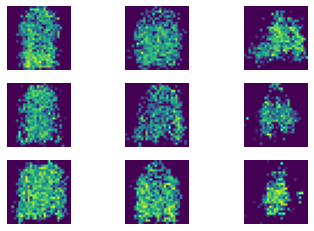

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=657.6274890625, RL loss=640.979209375, KL loss=16.648282751464844


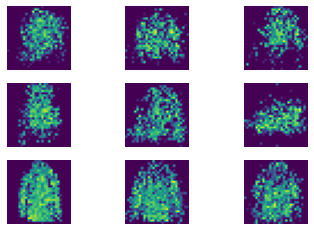

<Figure size 1080x1080 with 0 Axes>

In [ ]:
L1 = 50  # number of latents
# Training procedure  beta = 0.2
encoder = nn.Sequential(nn.Linear(Dims, H), nn.LeakyReLU(),
                        nn.Unflatten(1, (1, 16, 16)),
                        nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
                        nn.MaxPool2d(2, 2),
                        nn.ReLU(),
                        nn.Flatten(),
                        nn.Linear(512, 128), nn.LeakyReLU(),
                        nn.Linear(128, 2 * L1)
                   )
decoder = nn.Sequential(nn.Linear(L1, 128), nn.LeakyReLU(),
                        nn.Linear(128, 512), nn.LeakyReLU(),
                        nn.Unflatten(1, (8, 8, 8)),
                        nn.ConvTranspose2d(8, 8, kernel_size=3),
                        nn.Flatten(),
                        nn.Linear(800, states * Dims)
                       )
model5 = betaVAE(beta=0.2,encoder_net=encoder, decoder_net=decoder, states=states, L=L1)
optimizer = torch.optim.Adamax([p for p in model5.parameters() if p.requires_grad == True], lr=0.001)

nll_val5,rl_val5,kl_val5 = training(name=result_dir + name+'0.2'+'_50', num_epochs=num_epochs, model=model5, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=641.41259296875, RL loss=609.817515625, KL loss=31.595079614257813


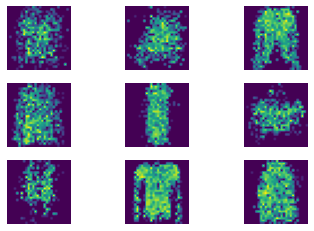

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=636.6030265625, RL loss=606.174998046875, KL loss=30.42803603515625


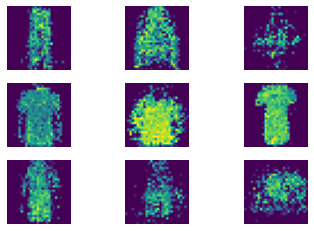

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=634.882128125, RL loss=604.443021875, KL loss=30.439104931640625


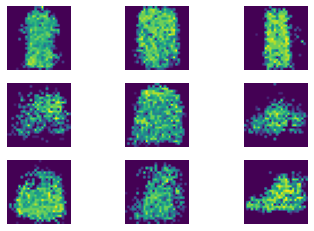

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=631.757376953125, RL loss=601.890538671875, KL loss=29.866836083984374


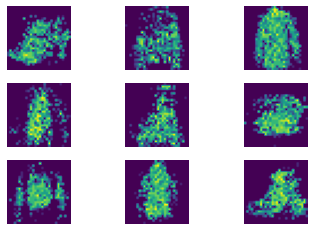

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=625.769483203125, RL loss=595.92682890625, KL loss=29.842653076171874


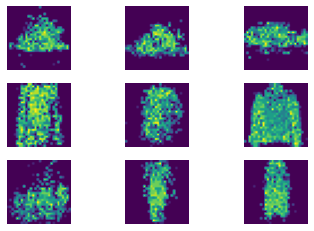

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=627.15193828125, RL loss=598.302604296875, KL loss=28.849329565429688


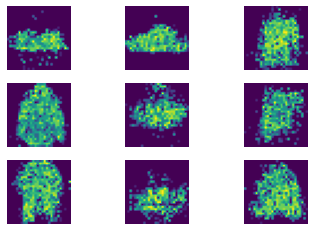

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=623.57429296875, RL loss=595.026594140625, KL loss=28.547701953125


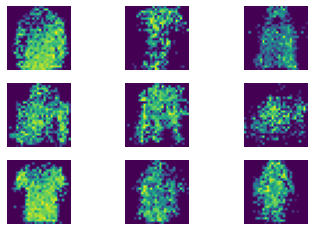

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=615.918787109375, RL loss=587.264853515625, KL loss=28.65393779296875


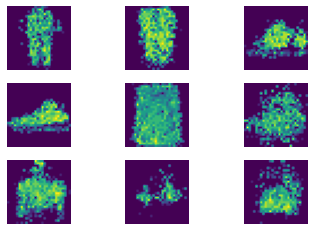

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=614.574556640625, RL loss=586.195807421875, KL loss=28.37874689941406


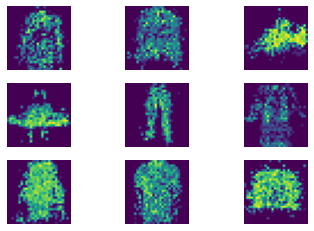

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=616.508139453125, RL loss=587.730611328125, KL loss=28.777533154296876


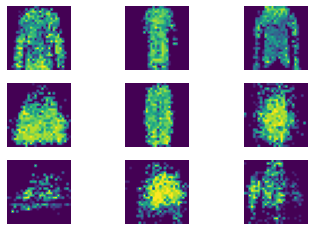

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=612.020894140625, RL loss=584.334615234375, KL loss=27.686276171875


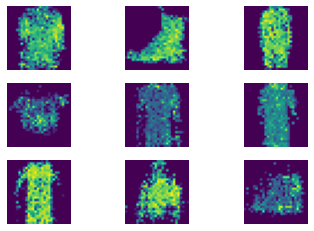

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 0.5

model6 = betaVAE(beta=0.5,encoder_net=encoder, decoder_net=decoder, states=states, L=L1)
optimizer = torch.optim.Adamax([p for p in model6.parameters() if p.requires_grad == True], lr=0.001)

nll_val6,rl_val6,kl_val6 = training(name=result_dir + name+'0.5'+'_50', num_epochs=num_epochs, model=model6, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=623.492121484375, RL loss=584.147892578125, KL loss=39.34422687988281


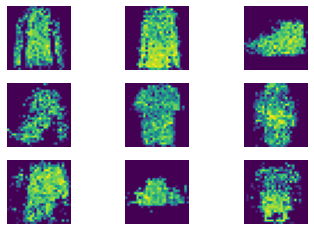

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=622.18481484375, RL loss=583.8795796875, KL loss=38.3052322265625


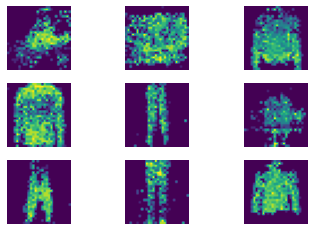

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=621.95183515625, RL loss=583.936591796875, KL loss=38.01524626464844


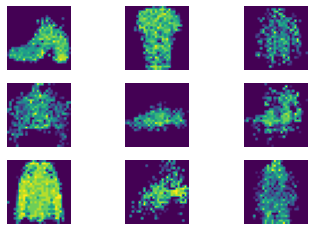

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=622.703718359375, RL loss=585.33923984375, KL loss=37.36448352050781


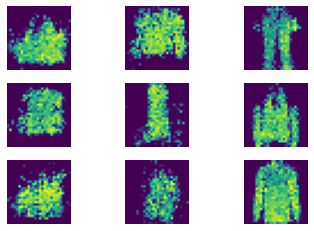

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=621.287604296875, RL loss=583.72580625, KL loss=37.561796801757815


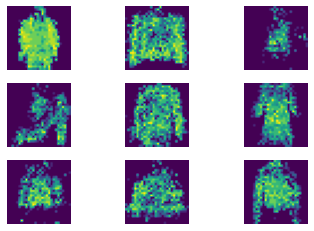

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=614.516137109375, RL loss=577.2729453125, KL loss=37.24319672851563


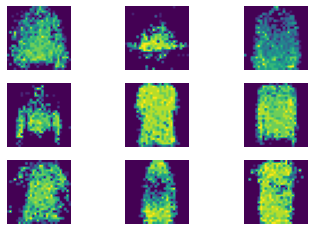

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=614.85612265625, RL loss=578.59113359375, KL loss=36.264992529296876


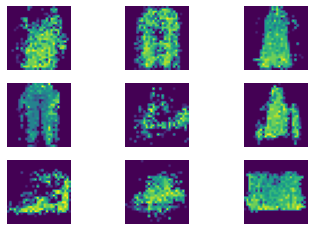

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=613.486871484375, RL loss=576.989256640625, KL loss=36.49761994628906


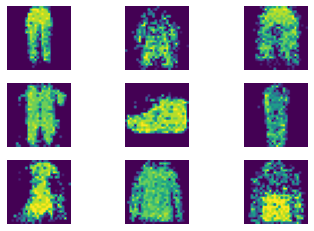

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=612.94581328125, RL loss=575.784000390625, KL loss=37.16181669921875


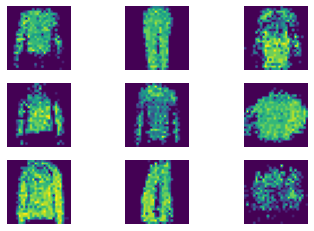

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=610.41202890625, RL loss=574.522803125, KL loss=35.88922404785156


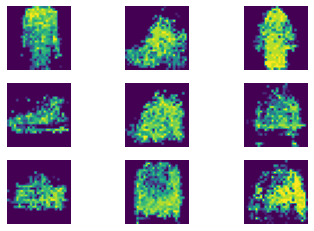

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=607.354082421875, RL loss=571.588844921875, KL loss=35.765238720703124


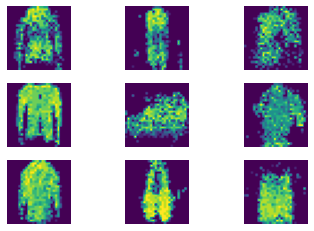

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 0.8

model7 = betaVAE(beta=0.8,encoder_net=encoder, decoder_net=decoder, states=states, L=L1)
optimizer = torch.optim.Adamax([p for p in model7.parameters() if p.requires_grad == True], lr=0.001)

nll_val7,rl_val7,kl_val7 = training(name=result_dir + name+'0.8'+'_50', num_epochs=num_epochs, model=model7, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=566.30898203125, RL loss=559.05385859375, KL loss=7.255128582763672


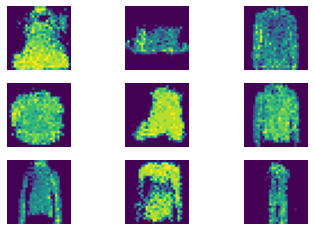

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=566.140659765625, RL loss=558.88305390625, KL loss=7.257606304931641


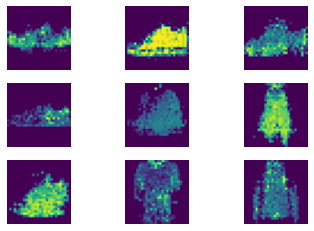

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=566.05324921875, RL loss=558.79105234375, KL loss=7.262198907470703


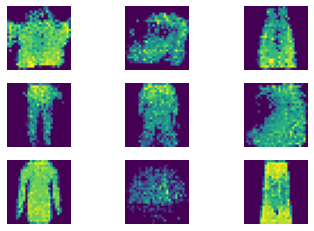

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=566.3267390625, RL loss=559.075372265625, KL loss=7.25137163696289


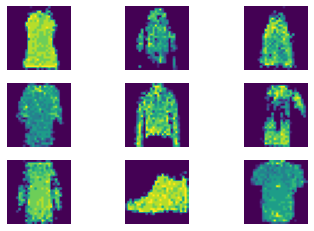

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=566.147855078125, RL loss=558.896491796875, KL loss=7.251357763671875


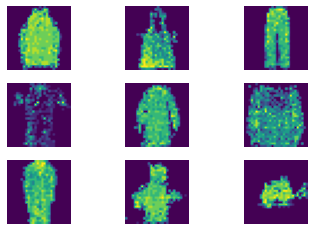

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=566.194996484375, RL loss=558.928023828125, KL loss=7.266971545410156


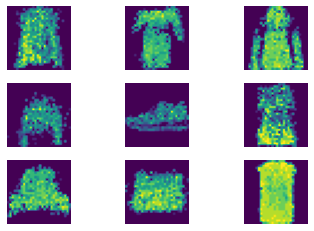

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=565.916983984375, RL loss=558.66219765625, KL loss=7.254789929199219


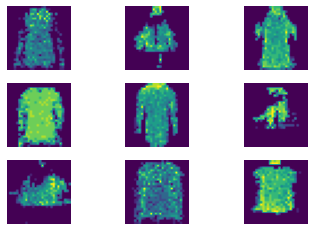

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=566.121395703125, RL loss=558.860990625, KL loss=7.260403845214844


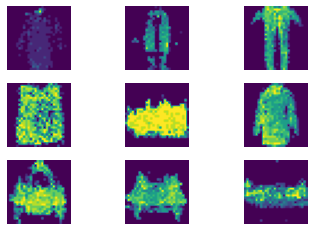

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=566.05418046875, RL loss=558.80471953125, KL loss=7.2494592956542965


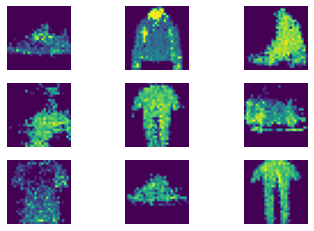

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=566.0014203125, RL loss=558.74587265625, KL loss=7.255543988037109


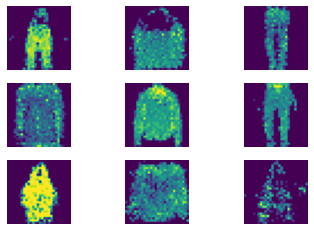

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=565.9934625, RL loss=558.737976953125, KL loss=7.255490557861328


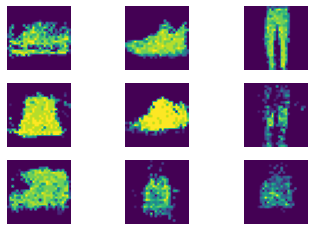

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 1

model8 = betaVAE(beta=1,encoder_net=encoder, decoder_net=decoder, states=states, L=L1)
optimizer = torch.optim.Adamax([p for p in model8.parameters() if p.requires_grad == True], lr=0.001)

nll_val8,rl_val8,kl_val8 = training(name=result_dir + name+'1'+'_50', num_epochs=num_epochs, model=model1, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

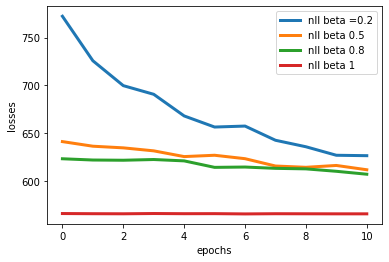

In [ ]:
plot_loss(nll_val5,nll_val6,nll_val7,nll_val8)

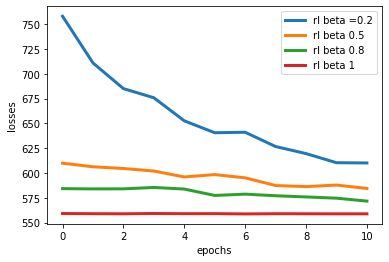

In [441]:
plot_loss1(rl_val5,rl_val6,rl_val7,rl_val8)

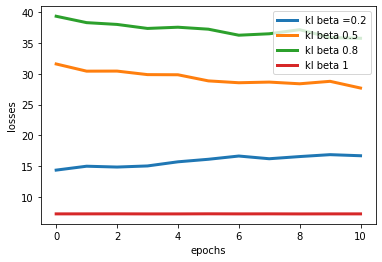

In [442]:
plot_loss2(kl_val5,kl_val6,kl_val7,kl_val8)

# latent dimension = 100

Epoch: 0, nll loss=1808.7550921875, RL loss=1806.6698296875, KL loss=2.085263716125488


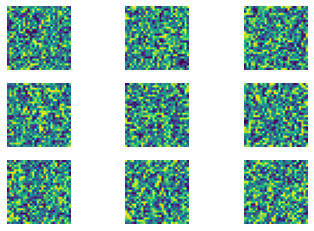

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=1808.771315625, RL loss=1806.6704453125, KL loss=2.1008506790161134


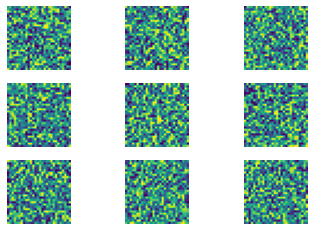

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=1808.7667796875, RL loss=1806.658959375, KL loss=2.107845050048828


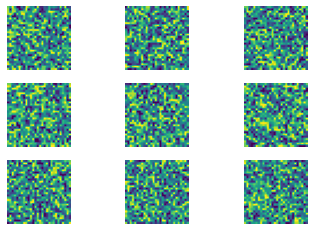

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=1808.7735546875, RL loss=1806.6706125, KL loss=2.1029379486083983


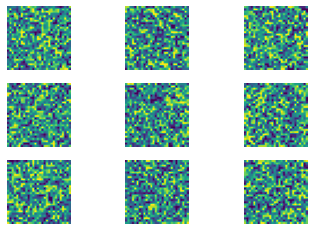

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=1808.7851375, RL loss=1806.67009375, KL loss=2.1150373962402345


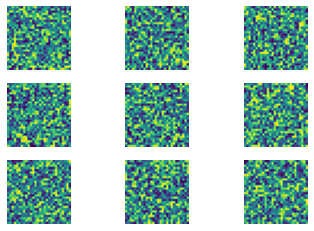

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=1808.7680046875, RL loss=1806.6629984375, KL loss=2.1049888061523436


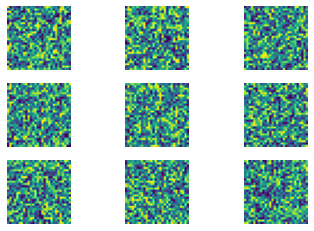

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=1808.7738203125, RL loss=1806.67958125, KL loss=2.0942331314086915


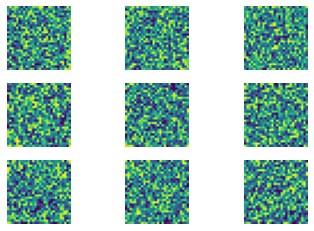

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=1808.7778859375, RL loss=1806.6716515625, KL loss=2.1062342864990233


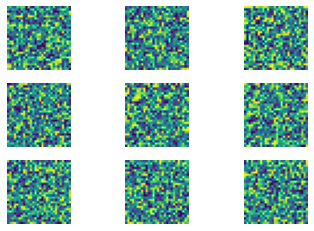

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=1808.7597234375, RL loss=1806.6684578125, KL loss=2.0912627822875978


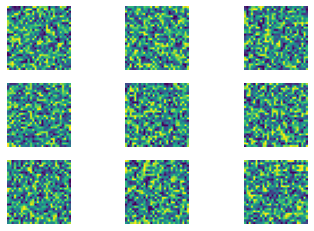

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=1808.77990625, RL loss=1806.67473125, KL loss=2.105172932434082


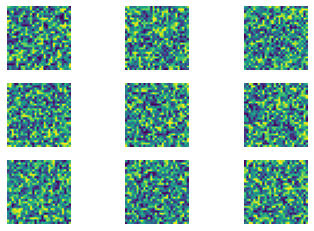

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=1808.7739046875, RL loss=1806.6673890625, KL loss=2.106518292236328


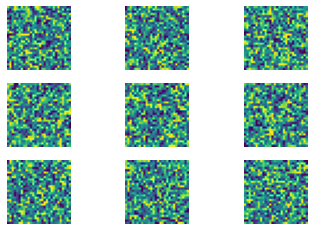

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
L2 = 100  # number of latents
# Training procedure  beta = 0.2
encoder = nn.Sequential(nn.Linear(Dims, H), nn.LeakyReLU(),
                        nn.Unflatten(1, (1, 16, 16)),
                        nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
                        nn.MaxPool2d(2, 2),
                        nn.ReLU(),
                        nn.Flatten(),
                        nn.Linear(512, 128), nn.LeakyReLU(),
                        nn.Linear(128, 2 * L2)
                   )
decoder = nn.Sequential(nn.Linear(L2, 128), nn.LeakyReLU(),
                        nn.Linear(128, 512), nn.LeakyReLU(),
                        nn.Unflatten(1, (8, 8, 8)),
                        nn.ConvTranspose2d(8, 8, kernel_size=3),
                        nn.Flatten(),
                        nn.Linear(800, states * Dims)
                       )

model9 = betaVAE(beta=0.2,encoder_net=encoder, decoder_net=decoder, states=states, L=L2)
optimizer = torch.optim.Adamax([p for p in model5.parameters() if p.requires_grad == True], lr=0.001)

nll_val9,rl_val9,kl_val9 = training(name=result_dir + name+'0.2'+'_100', num_epochs=5, model=model9, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=811.969203125, RL loss=790.15852265625, KL loss=21.810672985839844


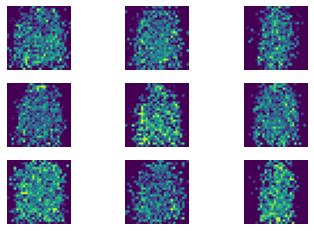

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=753.13144921875, RL loss=728.96433359375, KL loss=24.167110961914062


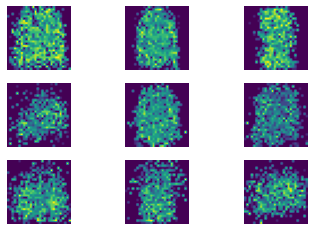

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=729.77228515625, RL loss=706.380721875, KL loss=23.391563256835937


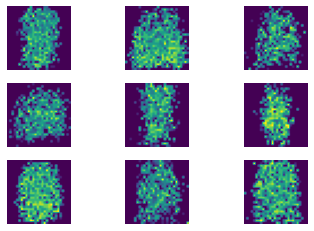

<Figure size 1080x1080 with 0 Axes>

Epoch: 3, nll loss=706.956545703125, RL loss=684.421891796875, KL loss=22.534659033203123


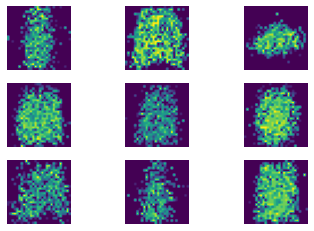

<Figure size 1080x1080 with 0 Axes>

Epoch: 4, nll loss=692.42761953125, RL loss=669.889197265625, KL loss=22.538421044921876


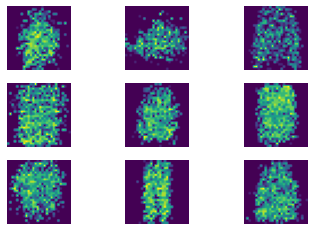

<Figure size 1080x1080 with 0 Axes>

Epoch: 5, nll loss=685.740899609375, RL loss=663.52675390625, KL loss=22.214147485351564


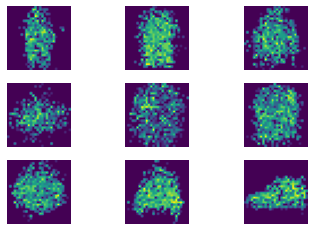

<Figure size 1080x1080 with 0 Axes>

Epoch: 6, nll loss=670.989014453125, RL loss=648.73140078125, KL loss=22.25761328125


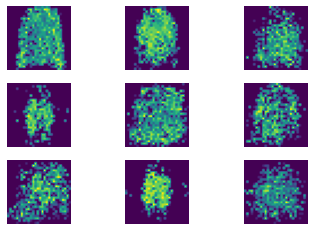

<Figure size 1080x1080 with 0 Axes>

Epoch: 7, nll loss=662.04486875, RL loss=640.285077734375, KL loss=21.759784228515624


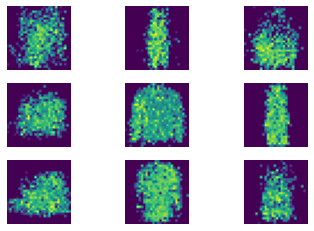

<Figure size 1080x1080 with 0 Axes>

Epoch: 8, nll loss=653.709283984375, RL loss=631.302165625, KL loss=22.407124536132812


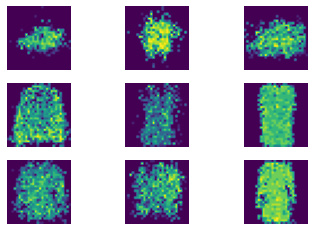

<Figure size 1080x1080 with 0 Axes>

Epoch: 9, nll loss=647.161341796875, RL loss=625.1336171875, KL loss=22.02772512207031


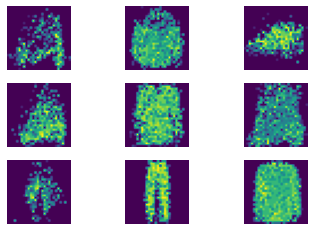

<Figure size 1080x1080 with 0 Axes>

Epoch: 10, nll loss=642.963078515625, RL loss=621.321858984375, KL loss=21.641219116210937


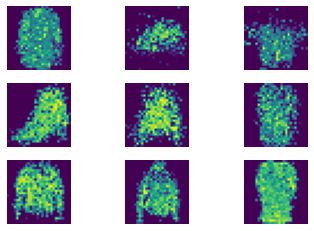

<Figure size 1080x1080 with 0 Axes>

saved!


In [ ]:
# Training procedure  beta = 0.5

model10 = betaVAE(beta=0.5,encoder_net=encoder, decoder_net=decoder, states=states, L=L2)
optimizer = torch.optim.Adamax([p for p in model10.parameters() if p.requires_grad == True], lr=0.001)

nll_val10,rl_val10,kl_val10 = training(name=result_dir + name+'0.5'+'_100', num_epochs=5, model=model10, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=643.742369921875, RL loss=615.089264453125, KL loss=28.653104296875


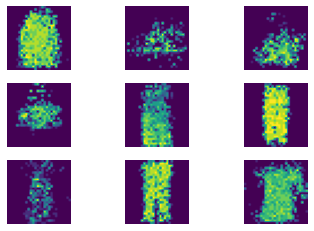

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=643.06283359375, RL loss=614.038008984375, KL loss=29.024822900390625


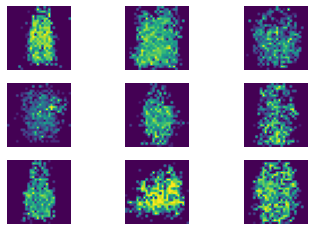

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=639.1938140625, RL loss=610.55175625, KL loss=28.642061059570313


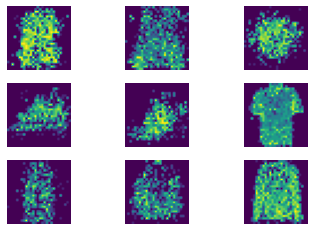

<Figure size 1080x1080 with 0 Axes>

saved!


In [443]:
# Training procedure  beta = 0.8

model11 = betaVAE(beta=0.8,encoder_net=encoder, decoder_net=decoder, states=states, L=L2)
optimizer = torch.optim.Adamax([p for p in model11.parameters() if p.requires_grad == True], lr=0.001)

nll_val11,rl_val11,kl_val11 = training(name=result_dir + name+'0.8'+'_100', num_epochs=3, model=model11, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

Epoch: 0, nll loss=642.942719921875, RL loss=609.909360546875, KL loss=33.03335698242188


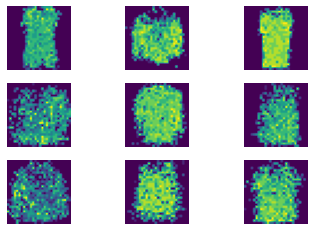

<Figure size 1080x1080 with 0 Axes>

Epoch: 1, nll loss=641.398164453125, RL loss=609.102401171875, KL loss=32.295765112304686


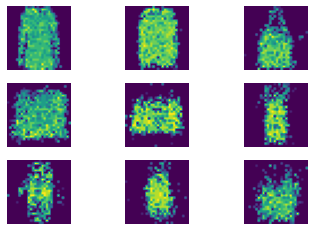

<Figure size 1080x1080 with 0 Axes>

Epoch: 2, nll loss=640.50083359375, RL loss=607.79773203125, KL loss=32.7031033203125


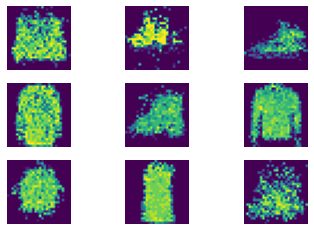

<Figure size 1080x1080 with 0 Axes>

saved!


In [444]:
# Training procedure  beta = 1

model12 = betaVAE(beta=1,encoder_net=encoder, decoder_net=decoder, states=states, L=L2)
optimizer = torch.optim.Adamax([p for p in model12.parameters() if p.requires_grad == True], lr=0.001)

nll_val12,rl_val12,kl_val12 = training(name=result_dir + name+'1'+'_100', num_epochs=3, model=model12, optimizer=optimizer,training_loader=train_loader, test_loader=test_loader)

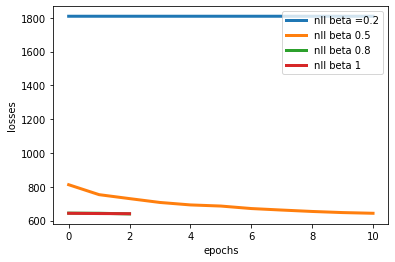

In [445]:
plot_loss(nll_val9,nll_val10,nll_val11,nll_val12)

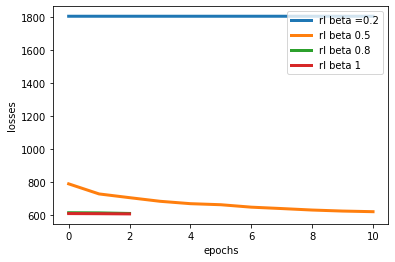

In [446]:
plot_loss1(rl_val9,rl_val10,rl_val11,rl_val12)

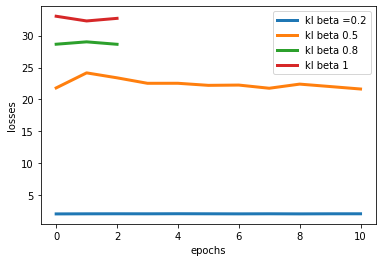

In [447]:
plot_loss2(kl_val9,kl_val10,kl_val11,kl_val12)

# EBM Part

In [423]:
class EBMClassifier(nn.Module):
# binary classifer d(z)  
    def __init__(self):
        super(EBMClassifier, self).__init__()
        self.Layers = nn.Sequential(nn.Linear(16, 24), nn.ReLU(),
                        nn.Linear(24, 10), nn.ReLU(),
                        nn.Linear(10,1))

    def forward(self, z):
        z = self.Layers(z)
        return torch.sigmoid(z)

# creating torch dataset
class EBMDataset(Dataset):
    def __init__(self, data, targets):
        self.data = data
        self.targets = torch.LongTensor(targets)
        
    def __getitem__(self, index):
        x = self.data[index]
        y = self.targets[index]
        
        return x, y
    
    def __len__(self):
        return len(self.data)        

# beta = 0.2, latent dim = 16

In [424]:
# beta = 0.2, latent dim = 16
data1,targets1 = [],[]
for indx, (img_batch,_) in enumerate(train_loader):
  model1.eval()
  if indx % 50 == 0:
    print("batches done: ",indx)
  for i in range(0,100):
      # get q(z)
      q_z = model1.encoder.e_sample(img_batch[i].unsqueeze(0).type(torch.FloatTensor))
      z = torch.randn(1, 16)
      data1.append(q_z.squeeze(0).detach())
      targets1.append(1)
      data1.append(z.squeeze(0))
      targets1.append(0)
dataset1 = EBMDataset(data1, targets1)
dataloader1 = DataLoader(dataset1, batch_size=200, shuffle=True)      

batches done:  0
batches done:  50
batches done:  100
batches done:  150
batches done:  200
batches done:  250
batches done:  300
batches done:  350
batches done:  400
batches done:  450
batches done:  500
batches done:  550


In [425]:
# nce
ebm1 = EBMClassifier()
criterion = nn.BCELoss()
optimizer = optim.SGD(ebm1.parameters(), lr=0.001)
for epoch in range(20):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, (imgs,labels) in enumerate(dataloader1):

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = ebm1(imgs.type(torch.FloatTensor))

        loss1 = criterion(outputs, labels.unsqueeze(1).float())

        loss1.backward()
        optimizer.step()

        # print statistics
        running_loss += loss1.item()
    print(f'Epoch: {epoch}, bce loss={running_loss / 600}')
    running_loss = 0.0

print('Finished Training')

Epoch: 0, bce loss=0.6947209939360619
Epoch: 1, bce loss=0.6935595106085142
Epoch: 2, bce loss=0.6927125989397367
Epoch: 3, bce loss=0.6920536980032921
Epoch: 4, bce loss=0.6915039963523547
Epoch: 5, bce loss=0.691011875073115
Epoch: 6, bce loss=0.6905469505985578
Epoch: 7, bce loss=0.6900893996159235
Epoch: 8, bce loss=0.6896278023719787
Epoch: 9, bce loss=0.6891547752420107
Epoch: 10, bce loss=0.6886623508731524
Epoch: 11, bce loss=0.688144919971625
Epoch: 12, bce loss=0.6876017821828524
Epoch: 13, bce loss=0.6870296518007915
Epoch: 14, bce loss=0.6864277275403341
Epoch: 15, bce loss=0.6857936280965805
Epoch: 16, bce loss=0.6851280587911606
Epoch: 17, bce loss=0.6844334614276886
Epoch: 18, bce loss=0.683710812330246
Epoch: 19, bce loss=0.682960199813048
Finished Training


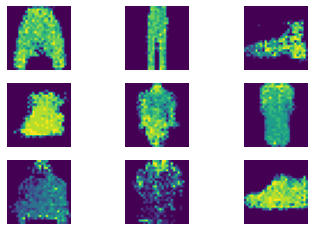

<Figure size 1080x1080 with 0 Axes>

In [426]:
def E(z):
    # energy function for vae r(z) and p(z)
    return torch.log(ebm1(z)/(1-ebm1(z))) + log_standard_normal(torch.randn((1, 16)))

def langevin_sampling(X,input_dim=16, n_samples=9, n_iter=200):

      X.requires_grad_()
      # print(X)
      for t in range(n_iter):
          E(X).sum().backward()

          #langevin equation
          eps = .1 * (10 + t) ** -1
          sigma = np.sqrt(eps)
          eta = sigma * torch.randn(n_samples, input_dim)
          X.data -= (eps / 2) * X.grad - eta

          X.grad.zero_()

      return X.detach() # sample obtained from langevin

def plot_sample(model_best,n_samples):

    # Generating samples ...
    model_best.eval()

    x_dim,y_dim = 3,3
    pncp = langevin_sampling(torch.randn(n_samples, 16),input_dim=16, n_samples=n_samples, n_iter=200)
    mu_d = model_best.decoder.decode(pncp)
    b,m = mu_d.shape[0],mu_d.shape[1]
    mu_d = mu_d.view(mu_d.shape[0], -1, 10)
    # print(mu_d.shape)
    p = mu_d.view(-1, 10)
    # print(p.shape)
    x = torch.multinomial(p, num_samples=1).view(b, m).detach().numpy()  

    # Plotting the samples in 3*3 grid 
    fig, ax = plt.subplots(x_dim, y_dim)
    for i, ax in enumerate(ax.flatten()):
        plot_image = np.reshape(x[i], (28, 28))
        ax.imshow(plot_image)
        ax.axis('off')
    plt.figure(figsize=(15, 15))
    plt.show()
plot_sample(model1,9)    

# beta=0.5 latent = 16

In [427]:
# beta = 0.5, latent dim = 16
data2,targets2 = [],[]
for indx, (img_batch,_) in enumerate(train_loader):
  model2.eval()
  if indx % 50 == 0:
    print("batches done: ",indx)
  for i in range(0,100):
      # get q(z)
      q_z = model1.encoder.e_sample(img_batch[i].unsqueeze(0).type(torch.FloatTensor))
      z = torch.randn(1, 16)
      data2.append(q_z.squeeze(0).detach())
      targets2.append(1)
      data2.append(z.squeeze(0))
      targets2.append(0)
dataset2 = EBMDataset(data2, targets2)
dataloader2 = DataLoader(dataset2, batch_size=200, shuffle=True)  

batches done:  0
batches done:  50
batches done:  100
batches done:  150
batches done:  200
batches done:  250
batches done:  300
batches done:  350
batches done:  400
batches done:  450
batches done:  500
batches done:  550


In [428]:
# nce
ebm2 = EBMClassifier()
criterion = nn.BCELoss()
optimizer = optim.SGD(ebm2.parameters(), lr=0.001)
for epoch in range(20):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, (imgs,labels) in enumerate(dataloader1):

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = ebm1(imgs.type(torch.FloatTensor))

        loss2 = criterion(outputs, labels.unsqueeze(1).float())

        loss2.backward()
        optimizer.step()

        # print statistics
        running_loss += loss2.item()
    print(f'Epoch: {epoch}, bce loss={running_loss / 600}')
    running_loss = 0.0

print('Finished Training')

Epoch: 0, bce loss=0.6825726393858592
Epoch: 1, bce loss=0.6825726402799288
Epoch: 2, bce loss=0.6825726386904717
Epoch: 3, bce loss=0.682572641770045
Epoch: 4, bce loss=0.6825726398825646
Epoch: 5, bce loss=0.6825726383924484
Epoch: 6, bce loss=0.6825726376970609
Epoch: 7, bce loss=0.6825726407766343
Epoch: 8, bce loss=0.6825726381937662
Epoch: 9, bce loss=0.6825726398825646
Epoch: 10, bce loss=0.6825726389884949
Epoch: 11, bce loss=0.6825726387898127
Epoch: 12, bce loss=0.682572640478611
Epoch: 13, bce loss=0.6825726389884949
Epoch: 14, bce loss=0.6825726379950842
Epoch: 15, bce loss=0.6825726387898127
Epoch: 16, bce loss=0.682572639187177
Epoch: 17, bce loss=0.6825726402799288
Epoch: 18, bce loss=0.6825726376970609
Epoch: 19, bce loss=0.682572637796402
Finished Training


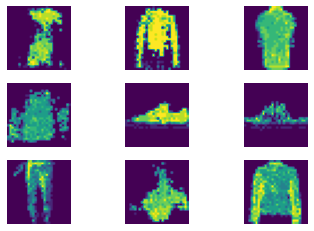

<Figure size 1080x1080 with 0 Axes>

In [429]:
def E(z):
    # energy function for vae
    return torch.log(ebm2(z)/(1-ebm2(z))) + log_standard_normal(torch.randn((1, 16)))

def langevin_sampling(X,input_dim=16, n_samples=9, n_iter=200):

      X.requires_grad_()
      # print(X)
      for t in range(n_iter):
          E(X).sum().backward()

          #langevin equation
          eps = .1 * (10 + t) ** -1
          sigma = np.sqrt(eps)
          eta = sigma * torch.randn(n_samples, input_dim)
          X.data -= (eps / 2) * X.grad - eta

          X.grad.zero_()

      return X.detach()

plot_sample(model2,9)

# beta = 0.8 latent = 16

In [430]:
# beta = 0.8, latent dim = 16
data3,targets3 = [],[]
for indx, (img_batch,_) in enumerate(train_loader):
  model3.eval()
  if indx % 50 == 0:
    print("batches done: ",indx)
  for i in range(0,100):
      # get q(z)
      q_z = model3.encoder.e_sample(img_batch[i].unsqueeze(0).type(torch.FloatTensor))
      z = torch.randn(1, 16)
      data3.append(q_z.squeeze(0).detach())
      targets3.append(1)
      data3.append(z.squeeze(0))
      targets3.append(0)
dataset3 = EBMDataset(data3, targets3)
dataloader3 = DataLoader(dataset3, batch_size=200, shuffle=True)  

batches done:  0
batches done:  50
batches done:  100
batches done:  150
batches done:  200
batches done:  250
batches done:  300
batches done:  350
batches done:  400
batches done:  450
batches done:  500
batches done:  550


In [431]:
# nce
ebm3 = EBMClassifier()
criterion = nn.BCELoss()
optimizer = optim.SGD(ebm3.parameters(), lr=0.001)
for epoch in range(20):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, (imgs,labels) in enumerate(dataloader1):

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = ebm1(imgs.type(torch.FloatTensor))

        loss3 = criterion(outputs, labels.unsqueeze(1).float())

        loss3.backward()
        optimizer.step()

        # print statistics
        running_loss += loss3.item()
    print(f'Epoch: {epoch}, bce loss={running_loss / 600}')
    running_loss = 0.0

print('Finished Training')

Epoch: 0, bce loss=0.6825726380944253
Epoch: 1, bce loss=0.6825726386904717
Epoch: 2, bce loss=0.6825726394852002
Epoch: 3, bce loss=0.6825726381937662
Epoch: 4, bce loss=0.6825726374983787
Epoch: 5, bce loss=0.6825726399819056
Epoch: 6, bce loss=0.6825726392865181
Epoch: 7, bce loss=0.6825726394852002
Epoch: 8, bce loss=0.682572641770045
Epoch: 9, bce loss=0.682572635114193
Epoch: 10, bce loss=0.6825726370016734
Epoch: 11, bce loss=0.6825726398825646
Epoch: 12, bce loss=0.6825726395845413
Epoch: 13, bce loss=0.6825726390878359
Epoch: 14, bce loss=0.6825726394852002
Epoch: 15, bce loss=0.6825726383924484
Epoch: 16, bce loss=0.6825726379950842
Epoch: 17, bce loss=0.6825726376970609
Epoch: 18, bce loss=0.68257264316082
Epoch: 19, bce loss=0.6825726381937662
Finished Training


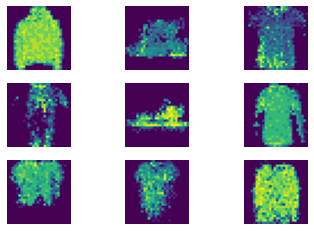

<Figure size 1080x1080 with 0 Axes>

In [432]:
def E(z):
    # energy function for vae
    return torch.log(ebm3(z)/(1-ebm3(z))) + log_standard_normal(torch.randn((1, 16)))

def langevin_sampling(X,input_dim=16, n_samples=9, n_iter=200):

      X.requires_grad_()
      # print(X)
      for t in range(n_iter):
          E(X).sum().backward()

          #langevin equation
          eps = .1 * (10 + t) ** -1
          sigma = np.sqrt(eps)
          eta = sigma * torch.randn(n_samples, input_dim)
          X.data -= (eps / 2) * X.grad - eta

          X.grad.zero_()

      return X.detach()

plot_sample(model3,9)

# beta = 1 latent = 16

In [433]:
# beta = 1, latent dim = 16
data4,targets4 = [],[]
for indx, (img_batch,_) in enumerate(train_loader):
  model4.eval()
  if indx % 50 == 0:
    print("batches done: ",indx)
  for i in range(0,100):
      # get q(z)
      q_z = model4.encoder.e_sample(img_batch[i].unsqueeze(0).type(torch.FloatTensor))
      z = torch.randn(1, 16)
      data4.append(q_z.squeeze(0).detach())
      targets4.append(1)
      data4.append(z.squeeze(0))
      targets4.append(0)
dataset4 = EBMDataset(data4, targets4)
dataloader4 = DataLoader(dataset4, batch_size=200, shuffle=True)  

batches done:  0
batches done:  50
batches done:  100
batches done:  150
batches done:  200
batches done:  250
batches done:  300
batches done:  350
batches done:  400
batches done:  450
batches done:  500
batches done:  550


In [434]:
# nce
ebm4 = EBMClassifier()
criterion = nn.BCELoss()
optimizer = optim.SGD(ebm4.parameters(), lr=0.001)
for epoch in range(20):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, (imgs,labels) in enumerate(dataloader1):

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = ebm4(imgs.type(torch.FloatTensor))

        loss4 = criterion(outputs, labels.unsqueeze(1).float())

        loss4.backward()
        optimizer.step()

        # print statistics
        running_loss += loss1.item()
    print(f'Epoch: {epoch}, bce loss={running_loss / 600}')
    running_loss = 0.0

print('Finished Training')

Epoch: 0, bce loss=0.6847284436225891
Epoch: 1, bce loss=0.6847284436225891
Epoch: 2, bce loss=0.6847284436225891
Epoch: 3, bce loss=0.6847284436225891
Epoch: 4, bce loss=0.6847284436225891
Epoch: 5, bce loss=0.6847284436225891
Epoch: 6, bce loss=0.6847284436225891
Epoch: 7, bce loss=0.6847284436225891
Epoch: 8, bce loss=0.6847284436225891
Epoch: 9, bce loss=0.6847284436225891
Epoch: 10, bce loss=0.6847284436225891
Epoch: 11, bce loss=0.6847284436225891
Epoch: 12, bce loss=0.6847284436225891
Epoch: 13, bce loss=0.6847284436225891
Epoch: 14, bce loss=0.6847284436225891
Epoch: 15, bce loss=0.6847284436225891
Epoch: 16, bce loss=0.6847284436225891
Epoch: 17, bce loss=0.6847284436225891
Epoch: 18, bce loss=0.6847284436225891
Epoch: 19, bce loss=0.6847284436225891
Finished Training


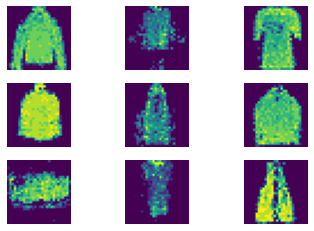

<Figure size 1080x1080 with 0 Axes>

In [435]:
def E(z):
    # energy function for vae
    return torch.log(ebm4(z)/(1-ebm4(z))) + log_standard_normal(torch.randn((1, 16)))

def langevin_sampling(X,input_dim=16, n_samples=9, n_iter=200):

      X.requires_grad_()
      # print(X)
      for t in range(n_iter):
          E(X).sum().backward()

          #langevin equation
          eps = .1 * (10 + t) ** -1
          sigma = np.sqrt(eps)
          eta = sigma * torch.randn(n_samples, input_dim)
          X.data -= (eps / 2) * X.grad - eta

          X.grad.zero_()

      return X.detach()


plot_sample(model4,9)